In [1]:
#1) Importing libraries, loading dataset

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("/Users/niccolocomar/Documents/Kaggle/Pima Indians Diabetes Database/pima_indians_database_diabetes.csv")

In [2]:
#2) Exploratory dataset analysis

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [3]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [5]:
df.shape 

(768, 9)

In [6]:
df.duplicated().sum() 

0

In [7]:
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

No duplicates nor Nan values in the dataset, which is all made of numerical features.
Our target variable is 'Outcome' (0: non diabetic patients, 1: diabetic patient)

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


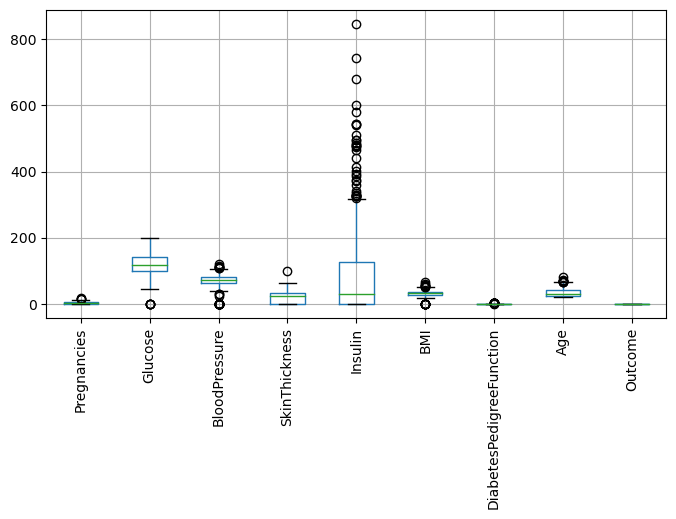

In [9]:
#Outliers check

plt.figure(figsize=(8,4))
df.boxplot()
plt.xticks(rotation=90)
plt.show()

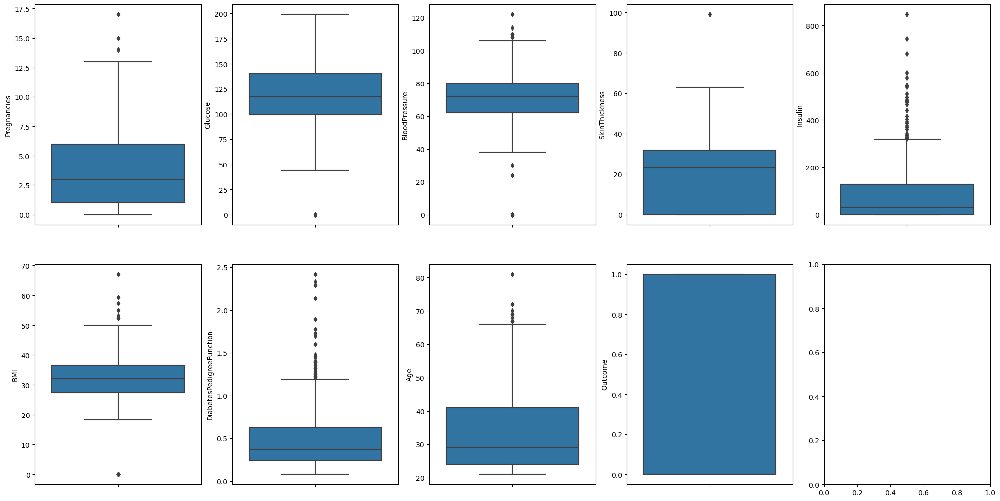

In [10]:
fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for k,v in df.items():
    sns.boxplot(y=k, data=df, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
plt.show()

Lots of outliers for ‘Insulin’, ‘BloodPressure’ and ‘DiabetesPedigreeFunction’ (there are some for ‘BMI’ and ‘Pregnancies’).

In [11]:
for k, v in df.items():
        q1 = v.quantile(0.25)
        q3 = v.quantile(0.75)
        irq = q3 - q1
        v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(df)[0]
        print("Column %s outliers = %.2f%%" % (k, perc))

Column Pregnancies outliers = 0.52%
Column Glucose outliers = 0.65%
Column BloodPressure outliers = 5.86%
Column SkinThickness outliers = 0.13%
Column Insulin outliers = 4.43%
Column BMI outliers = 2.47%
Column DiabetesPedigreeFunction outliers = 3.78%
Column Age outliers = 1.17%
Column Outcome outliers = 0.00%


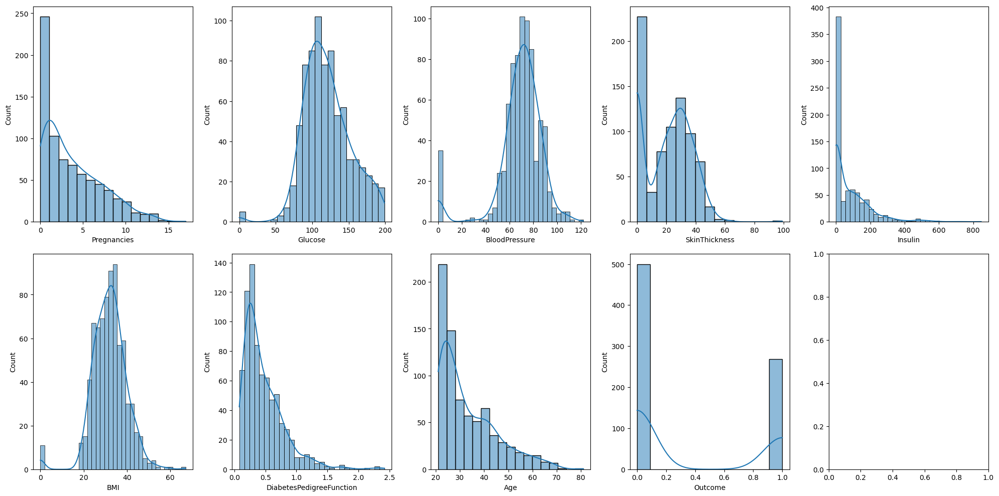

In [12]:
#Dataset distribution and skewness check

from scipy.stats import skew

fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()

for col in df:

    sns.histplot(df[col], kde=True, ax=axs[index])
    index += 1

plt.tight_layout()      
plt.show()

In [13]:
df.skew().sort_values(ascending=False) 

Insulin                     2.272251
DiabetesPedigreeFunction    1.919911
Age                         1.129597
Pregnancies                 0.901674
Outcome                     0.635017
Glucose                     0.173754
SkinThickness               0.109372
BMI                        -0.428982
BloodPressure              -1.843608
dtype: float64

'Insulin', 'DiabetesPedigreeFunction', 'Age' are left-skewed. 'BloodPressure' seems right-skewed because of the many zeros on the left

In [14]:
#Invalid zero values treatment

def columns_with_zero(dataframe):
    columns = []
    n_zero = []
    for col in dataframe.columns:
        count_zero = (dataframe[col] == 0).sum()
        if count_zero > 0:
            columns.append(col)
            n_zero.append(count_zero)
    return columns, n_zero

column_zero, zero_count = columns_with_zero(df)

for cols, counts in zip(column_zero, zero_count):
    print(f'{cols} has {counts} zeros')

Pregnancies has 111 zeros
Glucose has 5 zeros
BloodPressure has 35 zeros
SkinThickness has 227 zeros
Insulin has 374 zeros
BMI has 11 zeros
Outcome has 500 zeros


There are invalid zeroes in the dataset. Columns such as Glucose, BloodPressure, SkinThickness, Insulin, and BMI cannot have any zero values. These columns need to be processed before we create the model.

We can exclude Pregnancies and Outcome from the unusual zeros cleanup within our dataset (as a woman can obviously have 0 pregnancies, and a patient can generally have diabetes outcome '0' - meaning no diabetes). We will also leave DiabetesPedigreeFunction as it is.

In [15]:
# Replace invalid zeroes with NaN values

def replace_zero_nan(dataframe, columns):
    df_clean = dataframe.copy()
    df_clean[columns] = df_clean[columns].replace(0, np.nan)
    return df_clean

cols_to_clean = ['Glucose', 'SkinThickness', 'BloodPressure', 'Insulin', 'BMI']

df_clean = replace_zero_nan(df, cols_to_clean)

df_clean.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [16]:
check_missing_values = (df_clean.isnull().sum() / df_clean.shape[0]) * 100
check_missing_values[check_missing_values > 0].sort_values(ascending = False)

Insulin          48.697917
SkinThickness    29.557292
BloodPressure     4.557292
BMI               1.432292
Glucose           0.651042
dtype: float64

Since the insulin column has almost 49% of missing values and skin_thick column has almost 30% missing values, we will not delete those columns. We will try to impute those missing values based on their distribution and skewness. If the model do not perform well, we will keep the NaN values and try to re-create the model.

- Normal/approximately distribution: impute mean -> ['Glucose', 'BloodPressure']

- Skewed distribution: impute median -> ['Insulin', 'SkinThickness', 'BMI']


In [17]:
# Create function for columns that need mean imputing
def impute_mean(dataframe, columns):
    for col in columns:
        dataframe[col].fillna(dataframe[col].mean(), inplace=True)

In [18]:
# Create function for columns that need median imputing
def impute_median(dataframe, columns):
    for col in columns:
        dataframe[col].fillna(dataframe[col].median(), inplace=True)

In [19]:
mean_columns = ['Glucose', 'BloodPressure']
median_columns = ['Insulin', 'SkinThickness', 'BMI']

impute_mean(df_clean, mean_columns)
impute_median(df_clean, median_columns)

In [20]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.000000,6.00000,17.00
Glucose,768.0,121.686763,30.435949,44.000,99.75000,117.000000,140.25000,199.00
BloodPressure,768.0,72.405184,12.096346,24.000,64.00000,72.202592,80.00000,122.00
SkinThickness,768.0,29.108073,8.791221,7.000,25.00000,29.000000,32.00000,99.00
Insulin,768.0,140.671875,86.383060,14.000,121.50000,125.000000,127.25000,846.00
BMI,768.0,32.455208,6.875177,18.200,27.50000,32.300000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.372500,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.000000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.000000,1.00000,1.00


In [21]:
df_clean.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


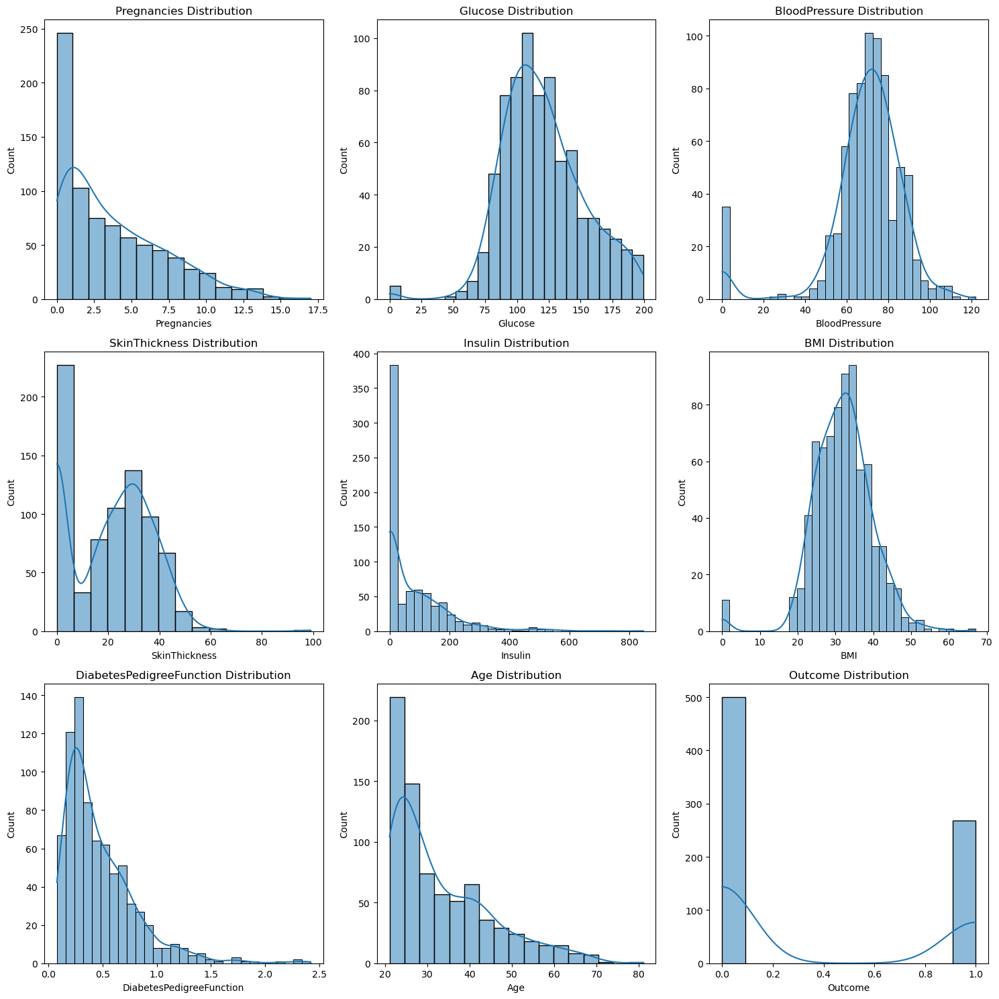

In [22]:
#Distributions BEFORE cleaning zeros (dataset: df)

columns=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age','Outcome']

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,15))

for i, col in enumerate(columns):
    ax_row, ax_col = i//3, i%3
    sns.histplot(data=df, x=col, kde=True, ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f"{col} Distribution")

plt.tight_layout()
plt.show()


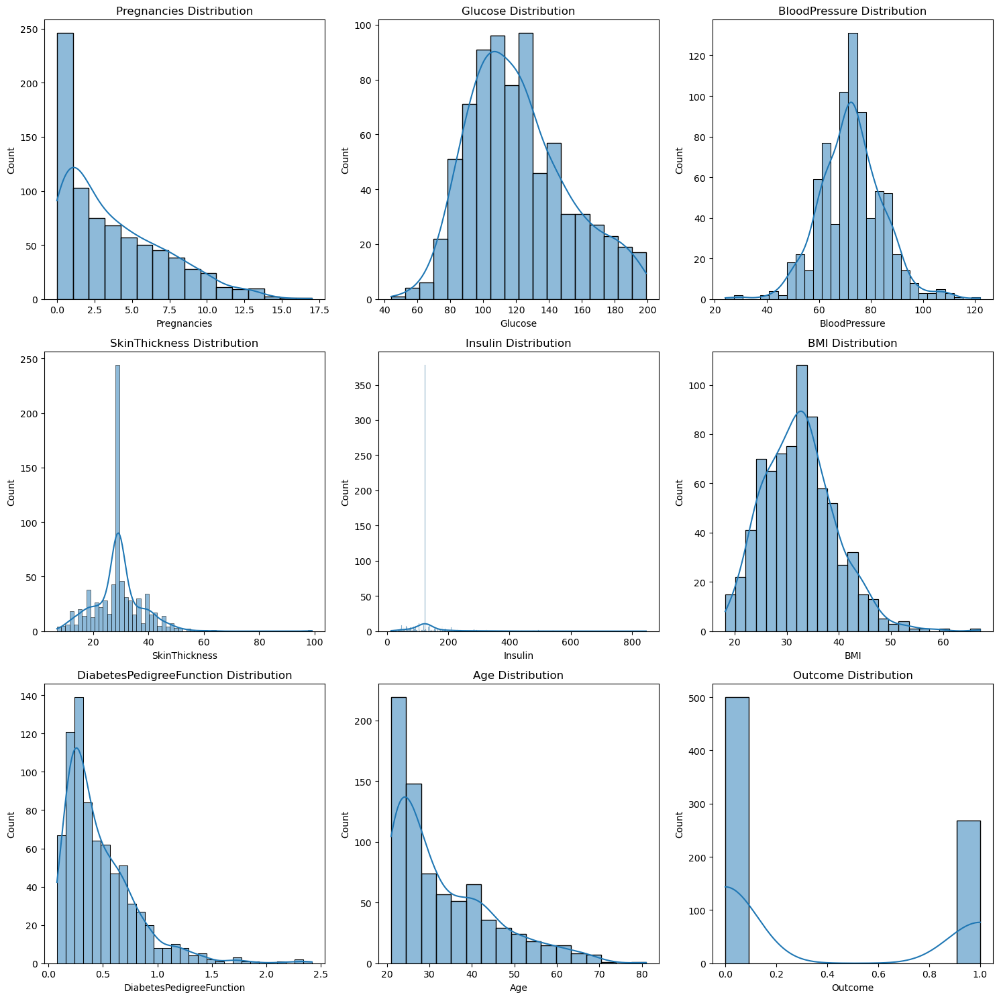

In [23]:
#Distributions AFTER cleaning zeros (dataset: df_clean)

columns=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age','Outcome']

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,15))

for i, col in enumerate(columns):
    ax_row, ax_col = i//3, i%3
    sns.histplot(data=df_clean, x=col, kde=True, ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f"{col} Distribution")

plt.tight_layout()
plt.show()

In [24]:
#Skewness after cleaning

df_clean.skew().sort_values(ascending=False)

Insulin                     3.380019
DiabetesPedigreeFunction    1.919911
Age                         1.129597
Pregnancies                 0.901674
SkinThickness               0.837608
Outcome                     0.635017
BMI                         0.599233
Glucose                     0.532719
BloodPressure               0.137305
dtype: float64

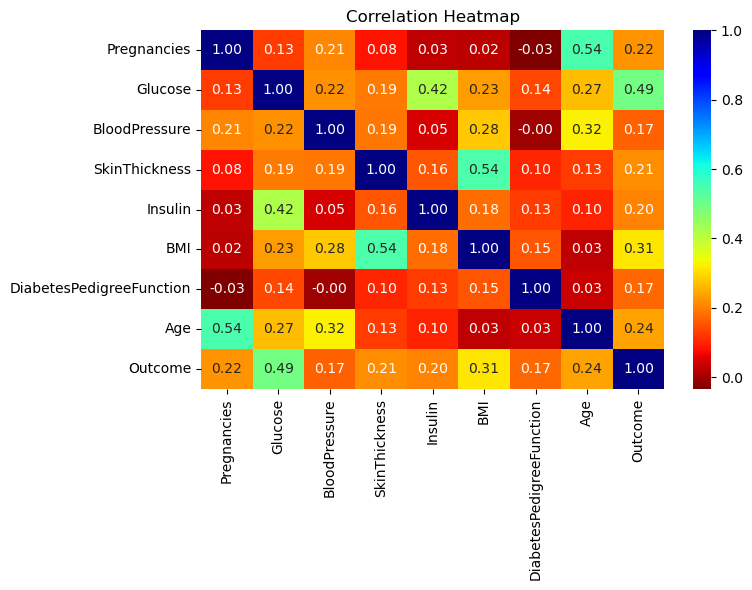

In [25]:
#3) Correlation for the df_clean dataset:

df_corr = df_clean.corr()

fig, ax = plt.subplots(figsize=(8,6))

sns.heatmap(data=df_corr, annot=True, fmt='.2f', cmap = 'jet_r')
plt.title("Correlation Heatmap")

plt.tight_layout()
plt.show()

'Glucose' seems to be the variable with the highest correlation with our target variable 'Outcome' (0.47); 'BMI' (0.31), 'Age' (0.24), 'Pregnancies' (0.22), 'SkinThickness' (0.21) and 'Insulin' (0.20) seem to have little effect on the target variable.

In [26]:
from scipy.stats import pearsonr

print(pearsonr(df_clean['Pregnancies'],df_clean['Outcome']))
print(pearsonr(df_clean['Glucose'],df_clean['Outcome']))
print(pearsonr(df_clean['BloodPressure'],df_clean['Outcome']))
print(pearsonr(df_clean['SkinThickness'],df_clean['Outcome']))
print(pearsonr(df_clean['Insulin'],df_clean['Outcome']))
print(pearsonr(df_clean['BMI'],df_clean['Outcome']))
print(pearsonr(df_clean['DiabetesPedigreeFunction'],df_clean['Outcome']))
print(pearsonr(df_clean['Age'],df_clean['Outcome']))
print(pearsonr(df_clean['Outcome'],df_clean['Outcome']))

PearsonRResult(statistic=0.221898153033985, pvalue=5.065127298053301e-10)
PearsonRResult(statistic=0.492927667612506, pvalue=2.909251656850966e-48)
PearsonRResult(statistic=0.16607366868294787, pvalue=3.709288185092499e-06)
PearsonRResult(statistic=0.21487321939198875, pvalue=1.7939583262324017e-09)
PearsonRResult(statistic=0.20379034224454606, pvalue=1.2100257034121536e-08)
PearsonRResult(statistic=0.3120383386771096, pvalue=8.336902677508598e-19)
PearsonRResult(statistic=0.1738440656529589, pvalue=1.2546070101484777e-06)
PearsonRResult(statistic=0.23835598302719618, pvalue=2.2099754606653353e-11)
PearsonRResult(statistic=0.9999999999999882, pvalue=0.0)


All features have a correlation value against ‘Outcome’ (target variable) which is statistically significant (all of their p-values are <0.05).
We can then use all features in our ML model later.

In [27]:
#4) Feature data standardization

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_clean.drop('Outcome', axis=1))
data_scaled

array([[ 0.63994726,  0.86510807, -0.03351824, ...,  0.16661938,
         0.46849198,  1.4259954 ],
       [-0.84488505, -1.20616153, -0.52985903, ..., -0.85219976,
        -0.36506078, -0.19067191],
       [ 1.23388019,  2.0158134 , -0.69530596, ..., -1.33250021,
         0.60439732, -0.10558415],
       ...,
       [ 0.3429808 , -0.0225789 , -0.03351824, ..., -0.910418  ,
        -0.68519336, -0.27575966],
       [-0.84488505,  0.14180757, -1.02619983, ..., -0.34279019,
        -0.37110101,  1.17073215],
       [-0.84488505, -0.94314317, -0.19896517, ..., -0.29912651,
        -0.47378505, -0.87137393]])

In [28]:
cols=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']
cols

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [29]:
data_scaled = pd.DataFrame(data_scaled, columns=cols)
data_scaled.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.639947,0.865108,-0.033518,0.670643,-0.181541,0.166619,0.468492,1.425995
1,-0.844885,-1.206162,-0.529859,-0.012301,-0.181541,-0.852200,-0.365061,-0.190672
2,1.233880,2.015813,-0.695306,-0.012301,-0.181541,-1.332500,0.604397,-0.105584
3,-0.844885,-1.074652,-0.529859,-0.695245,-0.540642,-0.633881,-0.920763,-1.041549
4,-1.141852,0.503458,-2.680669,0.670643,0.316566,1.549303,5.484909,-0.020496


In [30]:
data_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,2.544261e-17,1.000652,-1.141852,-0.844885,-0.250952,0.639947,3.906578
Glucose,768.0,-3.301757e-16,1.000652,-2.554131,-0.721221,-0.154088,0.610309,2.541850
BloodPressure,768.0,6.966722e-16,1.000652,-4.004245,-0.695306,-0.016759,0.628269,4.102655
SkinThickness,768.0,-1.795800e-16,1.000652,-2.516429,-0.467597,-0.012301,0.329171,7.955377
Insulin,768.0,4.416317e-17,1.000652,-1.467353,-0.222085,-0.181541,-0.155477,8.170442
BMI,768.0,2.815312e-16,1.000652,-2.074783,-0.721209,-0.022590,0.603256,5.042397
DiabetesPedigreeFunction,768.0,2.462585e-16,1.000652,-1.189553,-0.688969,-0.300128,0.466227,5.883565
Age,768.0,1.857600e-16,1.000652,-1.041549,-0.786286,-0.360847,0.660206,4.063716


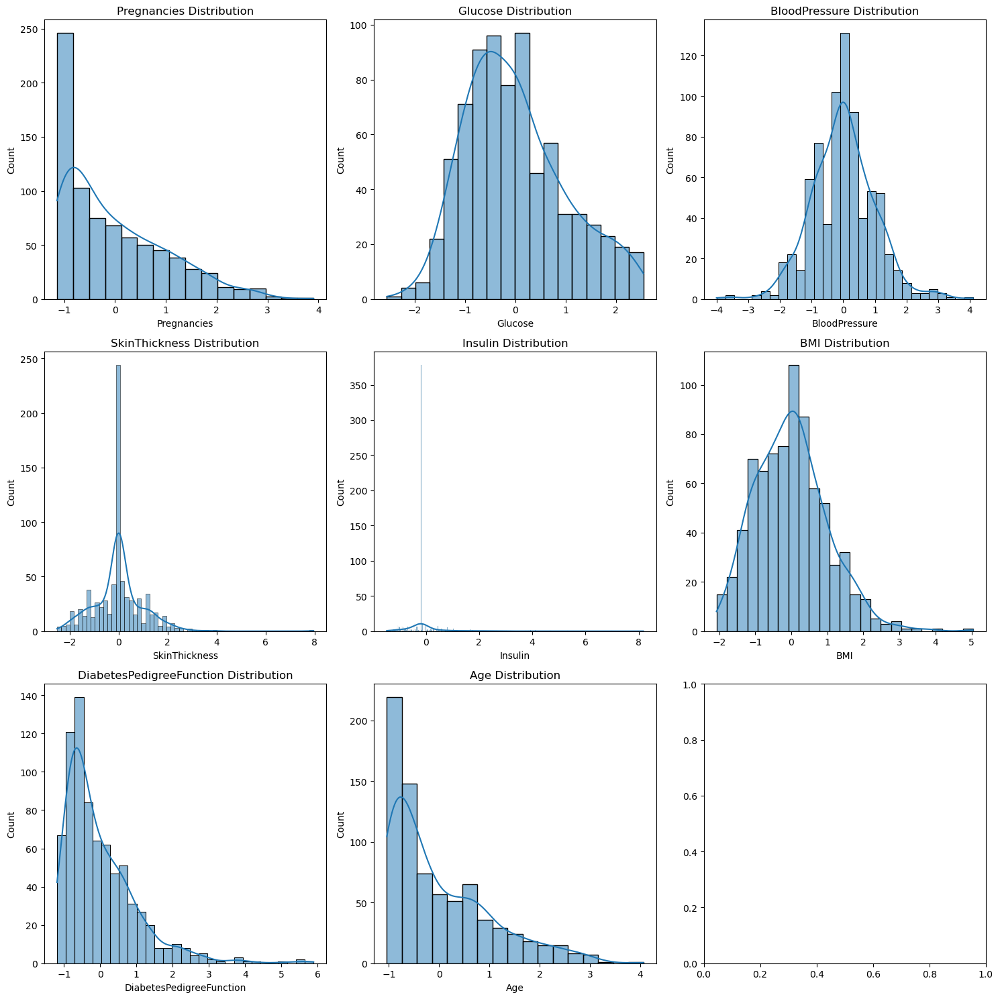

In [31]:
columns=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,15))

for i, col in enumerate(columns):
    ax_row, ax_col = i//3, i%3
    sns.histplot(data=data_scaled, x=col, kde=True, ax=axs[ax_row, ax_col])
    axs[ax_row, ax_col].set_title(f"{col} Distribution")

plt.tight_layout()
plt.show()

Now values for every feature have been successfully scaled.

In [32]:
#5) Machine Learning modeling

#Features, target, splitting the dataset into training and testing sets

X = data_scaled
y = df_clean['Outcome']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size=0.3, random_state=42) 
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((537, 8), (231, 8), (537,), (231,))

In [33]:
#5a) Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

rfc = RandomForestClassifier()

rfc.fit(X_train, y_train)
rfc.score(X_test,y_test)

0.7532467532467533

In [34]:
y_pred_rfc = rfc.predict(X_test)
y_pred_rfc

array([0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0])

In [35]:
from sklearn.metrics import accuracy_score

#RFC accuracy on training data

y_pred_rfr_train = rfc.predict(X_train)

print(accuracy_score(y_train, y_pred_rfr_train))
confusion_matrix(y_train, y_pred_rfr_train)

1.0


array([[349,   0],
       [  0, 188]])

In [36]:
#RFC accuracy on testing data

print(accuracy_score(y_test, y_pred_rfc))
confusion_matrix(y_test, y_pred_rfc)

0.7532467532467533


array([[122,  29],
       [ 28,  52]])

In [37]:
print(classification_report(y_pred_rfc, y_test))

              precision    recall  f1-score   support

           0       0.81      0.81      0.81       150
           1       0.65      0.64      0.65        81

    accuracy                           0.75       231
   macro avg       0.73      0.73      0.73       231
weighted avg       0.75      0.75      0.75       231



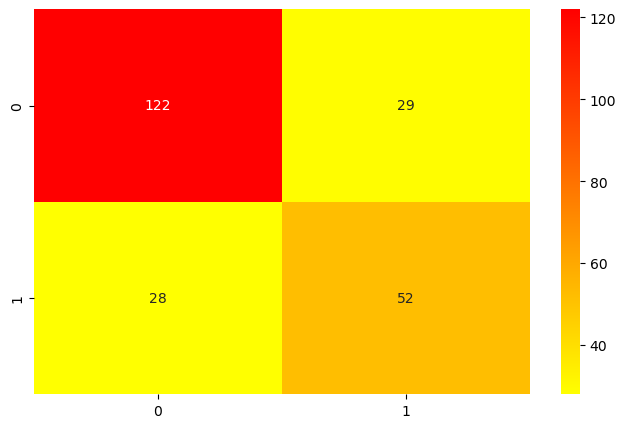

In [38]:
cm_rfc = confusion_matrix(y_test, y_pred_rfc)

plt.figure(figsize=(8,5))
sns.heatmap(cm_rfc, annot=True, fmt='g', cmap='autumn_r')
plt.show()

The RFC model is doing considerably good with predictions on the test set (75% accuracy). It is 82% precise with TN (124/151), but only 62% into predicting the actual diabetic cases (TP - 50/80). It is producing quite some FN (30 - diabetic persons which get predicted as non diabetic), but limited FP (27 cases predicted as diabetic, while they aren’t). As it’s far more important to detect correctly TP and limit FN, let’s try and tune the RFC model.

In [39]:
rfc.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [40]:
#Hyperparameter tuning for the Random Forest Classifier model

from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'] 
}

grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 5, 10],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]})

In [41]:
# Best RFC model
rfc_tuned = grid_search.best_estimator_
rfc_tuned.fit(X_train, y_train)
y_pred_rfc_tuned = rfc_tuned.predict(X_test)

In [42]:
# Summarize results
print(classification_report(y_test, y_pred_rfc_tuned))
print(confusion_matrix(y_test, y_pred_rfc_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.83      0.78      0.80       151
           1       0.62      0.69      0.65        80

    accuracy                           0.75       231
   macro avg       0.73      0.73      0.73       231
weighted avg       0.76      0.75      0.75       231

[[118  33]
 [ 25  55]]
{'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
0.7820526133610246


In [43]:
#Tuned RFC accuracy on training data

y_rfc_pred_train_tuned = rfc_tuned.predict(X_train)

print(accuracy_score(y_train, y_rfc_pred_train_tuned))
confusion_matrix(y_train, y_rfc_pred_train_tuned)

1.0


array([[349,   0],
       [  0, 188]])

In [44]:
#Tuned RFC accuracy on testing data

print(accuracy_score(y_test, y_pred_rfc_tuned))
confusion_matrix(y_test, y_pred_rfc_tuned)

0.7489177489177489


array([[118,  33],
       [ 25,  55]])

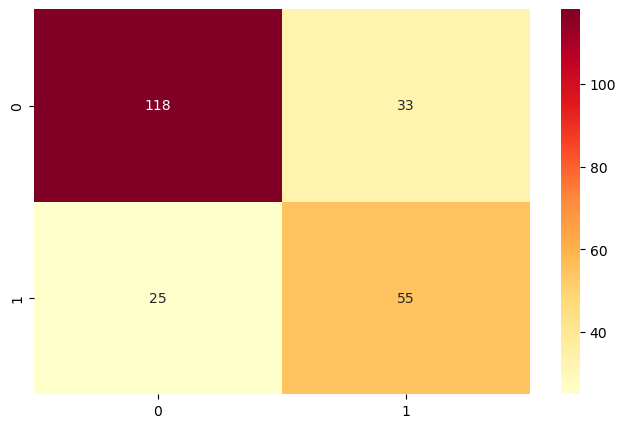

In [45]:
cm_rfc_tuned = confusion_matrix(y_test, y_pred_rfc_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_rfc_tuned, annot=True, fmt='g', cmap='YlOrRd')
plt.show()

The tuned RFC model is better at predicting TP (55/80), hence with less FN.
It is anot improving the TN predictions though (118/151, before it was 121/151), so FP are increasing a little.
We can consider the tuned RFC model as a little improvement though, as it reduces FN and increases TP (ultimately, diabetic cases detection is key). Still, the model seem to overfit from the training data

In [46]:
# True Positives
TP = cm_rfc_tuned[1, 1]

# True Negatives
TN = cm_rfc_tuned[0, 0] 

# False Positives
FP = cm_rfc_tuned[0, 1] 

# False Negatives
FN = cm_rfc_tuned[1, 0]

RFC AUC=0.734, Best Threshold=1.000000, G-Mean=0.733


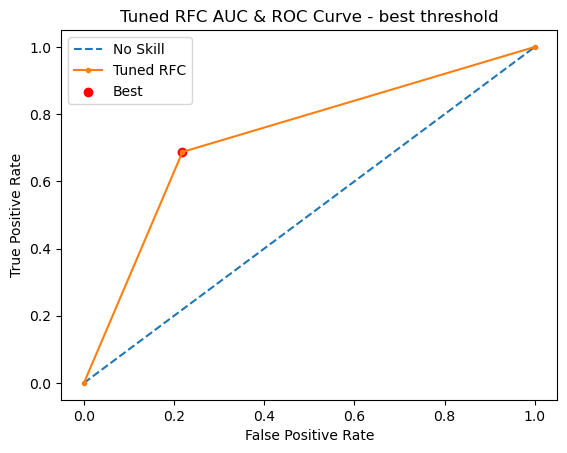

In [47]:
# Tuned RFC: AUC and ROC, best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_rfc_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_rfc_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('RFC AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned RFC AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned RFC')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.655


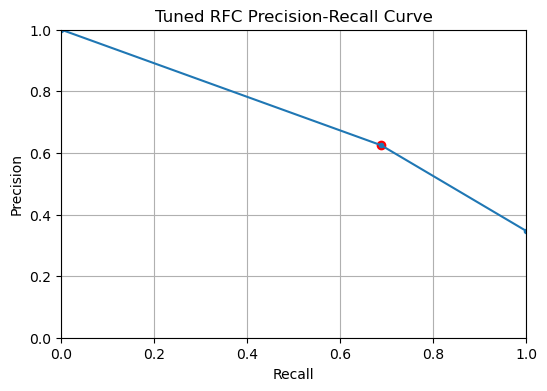

In [48]:
#Precision-Recall curve, best threshold

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_rfc_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned RFC Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

We now know that for our tuned RFC model (AUC= 0.734) the best threshold is 1, with G-Mean=0.733 and F-Score=0.655.

In [49]:
#5b) Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()

dtc.fit(X_train, y_train)
dtc.score(X_test,y_test)

0.683982683982684

In [50]:
y_pred_dtc = dtc.predict(X_test)
y_pred_dtc

array([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0])

In [51]:
print(classification_report(y_pred_dtc, y_test))

              precision    recall  f1-score   support

           0       0.72      0.78      0.75       140
           1       0.61      0.54      0.57        91

    accuracy                           0.68       231
   macro avg       0.67      0.66      0.66       231
weighted avg       0.68      0.68      0.68       231



In [52]:
cm_dtc = confusion_matrix(y_test, y_pred_dtc)
cm_dtc

array([[109,  42],
       [ 31,  49]])

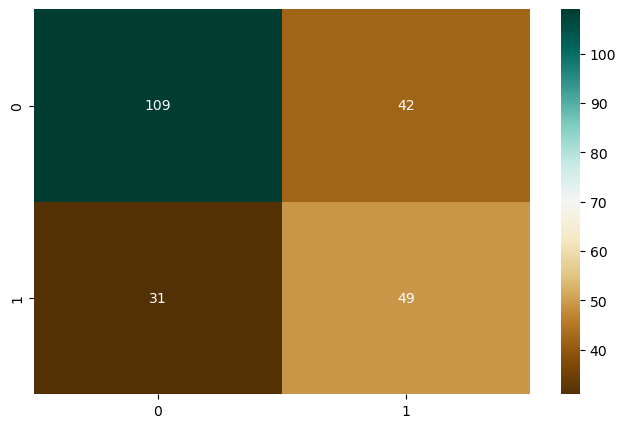

In [53]:
plt.figure(figsize=(8,5))
sns.heatmap(cm_dtc, annot=True, fmt='g', cmap='BrBG')
plt.show()

In [54]:
from sklearn.metrics import accuracy_score

#DTR accuracy on training data

y_dtr_train_pred = dtc.predict(X_train)

print(accuracy_score(y_train, y_dtr_train_pred))
confusion_matrix(y_train, y_dtr_train_pred)

1.0


array([[349,   0],
       [  0, 188]])

In [55]:
#DTR accuracy on testing data

print(accuracy_score(y_test, y_pred_dtc))
confusion_matrix(y_test, y_pred_dtc)

0.683982683982684


array([[109,  42],
       [ 31,  49]])

In [56]:
dtc.get_params().keys()

dict_keys(['ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'random_state', 'splitter'])

In [57]:
#DTC Hyperparameter tuning

params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dtc, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [58]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=10)

In [59]:
dtc_tuned = grid_search.best_estimator_

In [60]:
def evaluate_model(dtc):
    print("Train Accuracy :", accuracy_score(y_train, dtc_tuned.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dtc.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dtc_tuned.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dtc.predict(X_test)))

evaluate_model(dtc_tuned)

Train Accuracy : 0.8044692737430168
Train Confusion Matrix:
[[318  31]
 [ 74 114]]
--------------------------------------------------
Test Accuracy : 0.7575757575757576
Test Confusion Matrix:
[[128  23]
 [ 33  47]]


In [61]:
y_pred_dtc_tuned = dtc_tuned.predict(X_test)
print(classification_report(y_test, y_pred_dtc_tuned))
print(confusion_matrix(y_test, y_pred_dtc_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.80      0.85      0.82       151
           1       0.67      0.59      0.63        80

    accuracy                           0.76       231
   macro avg       0.73      0.72      0.72       231
weighted avg       0.75      0.76      0.75       231

[[128  23]
 [ 33  47]]
{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}
0.7709369817578773


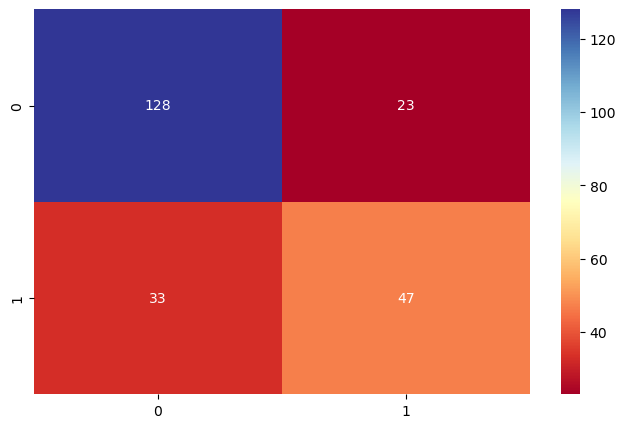

In [62]:
cm_dtc_tuned = confusion_matrix(y_test, y_pred_dtc_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_dtc_tuned, annot=True, fmt='g', cmap='RdYlBu')
plt.show()

The simple DTC model is doing good with TP (it can predict 49/80 from the test set, the tuned RFC did 47 so it's not improving the diabetic predictions), and it is only 72% accurate with TN (only 109/151 - the tuned RFC is predicting 128/151).
The tuned DTC model is hence reducing FP and increasing TN, while the TP predictions are a little worse.

DTC AUC=0.718, Best Threshold=1.000000, G-Mean=0.706


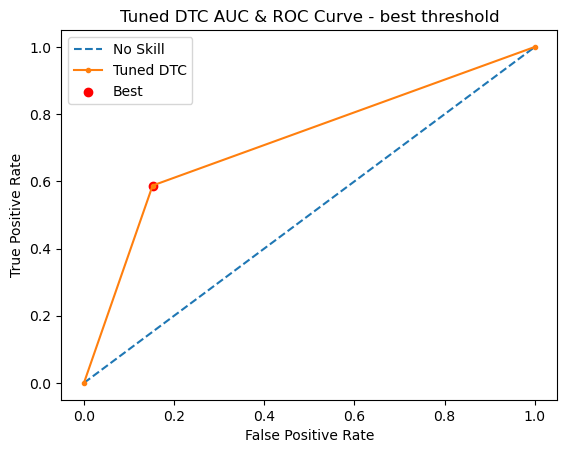

In [63]:
#Tuned DTC model: ROC, AUC and best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_dtc_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_dtc_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('DTC AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned DTC AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned DTC')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.627


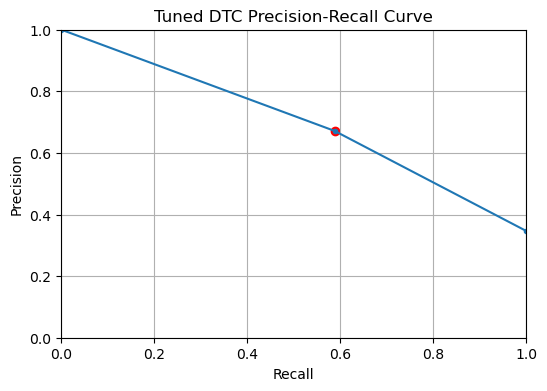

In [64]:
#Best threshold for tuned DTC according to the Precision-Recall curve

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_dtc_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned DTC Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

In [ ]:
We now know that for our tuned DTC model (AUC=0.718) the best threshold is 1, with G-Mean=0.706 and F-Score=0.627.

In [65]:
#5c) Support Vector Classifier (SVC)

from sklearn.svm import SVC

svc = SVC()

svc.fit(X_train, y_train)
svc.score(X_test,y_test)

0.7402597402597403

In [66]:
y_pred_svc = svc.predict(X_test)
y_pred_svc

array([0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0])

In [67]:
print(classification_report(y_pred_svc, y_test))

              precision    recall  f1-score   support

           0       0.83      0.78      0.81       161
           1       0.56      0.64      0.60        70

    accuracy                           0.74       231
   macro avg       0.70      0.71      0.70       231
weighted avg       0.75      0.74      0.74       231



In [68]:
cm_svc = confusion_matrix(y_test, y_pred_svc)
cm_svc

array([[126,  25],
       [ 35,  45]])

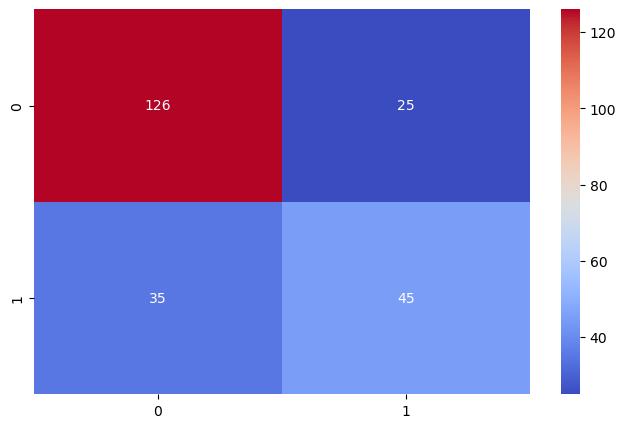

In [69]:
plt.figure(figsize=(8,5))
sns.heatmap(cm_svc, annot=True, fmt='g', cmap='coolwarm')
plt.show()

In [70]:
#SVC accuracy on training data

y_svc_train_pred = svc.predict(X_train)

print(accuracy_score(y_train, y_svc_train_pred))
confusion_matrix(y_train, y_svc_train_pred)

0.8379888268156425


array([[324,  25],
       [ 62, 126]])

In [71]:
svc.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [72]:
#Hyperparameter tuning for the SVC model

from sklearn.model_selection import GridSearchCV

param_grid = {'C' : [1.0, 10.0, 100.0, 1000.0], 
                  'kernel' : ['rbf', 'linear', 'poly', 'sigmoid']
                 }

grid_search = GridSearchCV(svc, param_grid, cv=5)

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [1.0, 10.0, 100.0, 1000.0],
                         'kernel': ['rbf', 'linear', 'poly', 'sigmoid']})

In [73]:
grid_search.best_estimator_

SVC(kernel='linear')

In [74]:
# Best SVC model
svc_tuned = grid_search.best_estimator_
svc_tuned.fit(X_train, y_train)
y_pred_svc_tuned = svc_tuned.predict(X_test)

In [75]:
# Summarize results
print(classification_report(y_test, y_pred_svc_tuned))
print(confusion_matrix(y_test, y_pred_svc_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.78      0.82      0.80       151
           1       0.63      0.57      0.60        80

    accuracy                           0.74       231
   macro avg       0.71      0.70      0.70       231
weighted avg       0.73      0.74      0.73       231

[[124  27]
 [ 34  46]]
{'C': 1.0, 'kernel': 'linear'}
0.7764797507788161


In [76]:
#Tuned SVC accuracy on training data

y_svc_pred_train_tuned = svc_tuned.predict(X_train)

print(accuracy_score(y_train, y_svc_pred_train_tuned))
confusion_matrix(y_train, y_svc_pred_train_tuned)

0.7783985102420856


array([[311,  38],
       [ 81, 107]])

In [77]:
#Tuned SVC accuracy on testing data

print(accuracy_score(y_test, y_pred_svc_tuned))
confusion_matrix(y_test, y_pred_svc_tuned)

0.7359307359307359


array([[124,  27],
       [ 34,  46]])

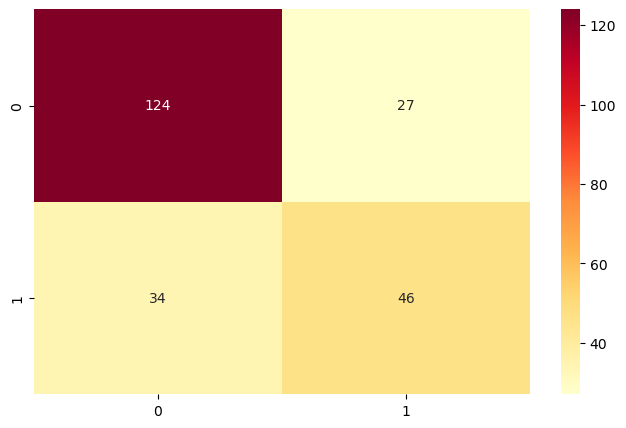

In [78]:
cm_svc_tuned = confusion_matrix(y_test, y_pred_svc_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_svc_tuned, annot=True, fmt='g', cmap='YlOrRd')
plt.show()

Very slight improvement in TP predictions for the tuned SVC model, but TN are decreasing as well.
The tuned SVC model doesn't seem like a steep improvement.

SVC AUC=0.698, Best Threshold=1.000000, G-Mean=0.687


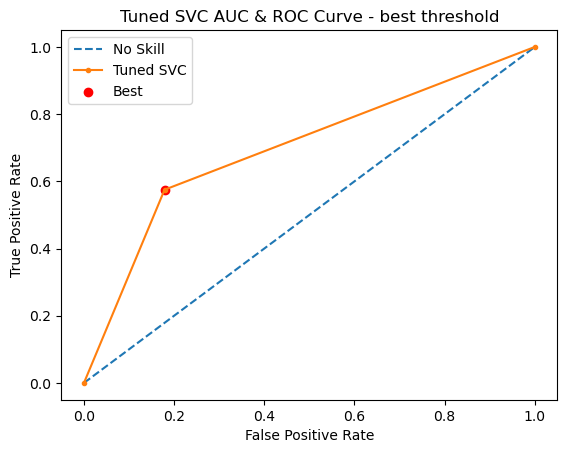

In [79]:
#Tuned SVC model: ROC, AUC and best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_svc_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_svc_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('SVC AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned SVC AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned SVC')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.601


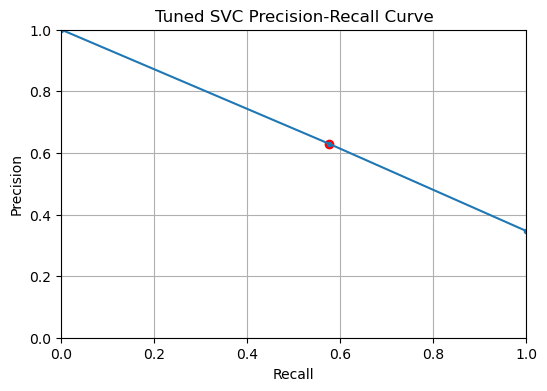

In [80]:
#Best threshold for tuned SVC according to the Precision-Recall curve

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_svc_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned SVC Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

According to ROC-AUC (SVC AUC = 0.698) and Precision-Recall Curve, the best threshold is 1 (with G-Mean=0.687 and F-Score=0.601) for the tuned SVC model.

In [81]:
#5d) Logistic Regression

from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

lr.fit(X_train, y_train)
lr.score(X_test,y_test)

0.7402597402597403

In [82]:
y_pred_lr = lr.predict(X_test)
y_pred_lr

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0])

In [83]:
lr.predict_proba(X_test)

array([[0.74425465, 0.25574535],
       [0.8185642 , 0.1814358 ],
       [0.89102356, 0.10897644],
       [0.87168835, 0.12831165],
       [0.51392208, 0.48607792],
       [0.56127739, 0.43872261],
       [0.98921681, 0.01078319],
       [0.65076435, 0.34923565],
       [0.40569756, 0.59430244],
       [0.22358753, 0.77641247],
       [0.78531153, 0.21468847],
       [0.08648566, 0.91351434],
       [0.55289907, 0.44710093],
       [0.77084537, 0.22915463],
       [0.94383975, 0.05616025],
       [0.64429202, 0.35570798],
       [0.88994852, 0.11005148],
       [0.93655681, 0.06344319],
       [0.24389157, 0.75610843],
       [0.39223681, 0.60776319],
       [0.81670329, 0.18329671],
       [0.92971161, 0.07028839],
       [0.51546704, 0.48453296],
       [0.91104112, 0.08895888],
       [0.43438115, 0.56561885],
       [0.09665447, 0.90334553],
       [0.90023434, 0.09976566],
       [0.97269474, 0.02730526],
       [0.70521306, 0.29478694],
       [0.90646743, 0.09353257],
       [0.

In [84]:
#LR accuracy on training data

y_lr_train_pred = lr.predict(X_train)

print(accuracy_score(y_train, y_lr_train_pred))
confusion_matrix(y_train, y_lr_train_pred)

0.7839851024208566


array([[310,  39],
       [ 77, 111]])

In [85]:
#LR accuracy on testing data

print(accuracy_score(y_test, y_pred_lr))
confusion_matrix(y_test, y_pred_lr)

0.7402597402597403


array([[124,  27],
       [ 33,  47]])

In [86]:
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.79      0.82      0.81       151
           1       0.64      0.59      0.61        80

    accuracy                           0.74       231
   macro avg       0.71      0.70      0.71       231
weighted avg       0.74      0.74      0.74       231



In [87]:
lr_dtc = confusion_matrix(y_test, y_pred_lr)
lr_dtc

array([[124,  27],
       [ 33,  47]])

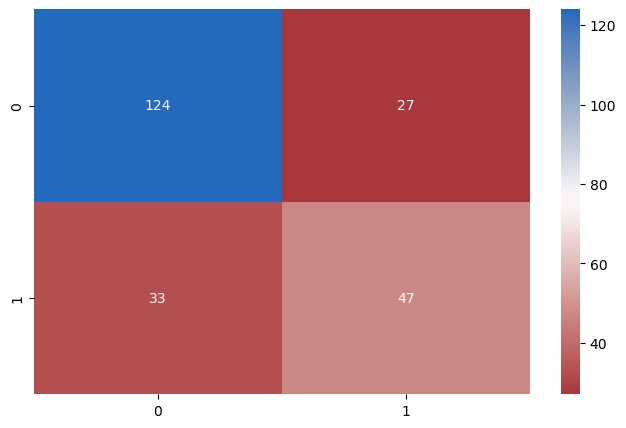

In [88]:

plt.figure(figsize=(8,5))
sns.heatmap(lr_dtc, annot=True, fmt='g', cmap='vlag_r')
plt.show()

In [89]:
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [90]:
#LR hyperparameter tuning

param_grid = { 'C' : np.logspace(-4, 4, 20), 'penalty': ['l1', 'l2', 'elasticnet', 'none'], 'solver': ['liblinear', 'saga'],'max_iter' : [100, 1000,2500, 5000]}

In [91]:
grid_search = GridSearchCV(lr, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 640 candidates, totalling 1920 fits


/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/niccoloc

GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'max_iter': [100, 1000, 2500, 5000],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['liblinear', 'saga']},
             verbose=True)

In [92]:
grid_search.best_estimator_

LogisticRegression(C=0.23357214690901212, solver='saga')

In [93]:
lr_tuned = grid_search.best_estimator_

In [94]:
def evaluate_model(lr_tuned):
    print("Train Accuracy :", accuracy_score(y_train, lr_tuned.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, lr.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, lr_tuned.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, lr.predict(X_test)))

evaluate_model(lr_tuned)

Train Accuracy : 0.7839851024208566
Train Confusion Matrix:
[[310  39]
 [ 77 111]]
--------------------------------------------------
Test Accuracy : 0.7445887445887446
Test Confusion Matrix:
[[124  27]
 [ 33  47]]


In [95]:
y_pred_lr_tuned = lr_tuned.predict(X_test)
print(classification_report(y_test, y_pred_lr_tuned))
print(confusion_matrix(y_test, y_pred_lr_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.79      0.83      0.81       151
           1       0.64      0.59      0.61        80

    accuracy                           0.74       231
   macro avg       0.72      0.71      0.71       231
weighted avg       0.74      0.74      0.74       231

[[125  26]
 [ 33  47]]
{'C': 0.23357214690901212, 'max_iter': 100, 'penalty': 'l2', 'solver': 'saga'}
0.7839851024208566


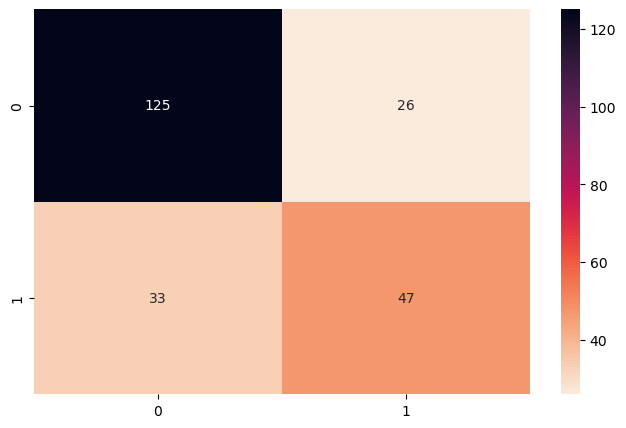

In [96]:
cm_lr_tuned = confusion_matrix(y_test, y_pred_lr_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_lr_tuned, annot=True, fmt='g', cmap='rocket_r')
plt.show()

The tuned LR model is just a little more precise on TN (125, before 124) than the regular LR model.
They both predict 47 TP and 33 FN.

LR AUC=0.708, Best Threshold=1.000000, G-Mean=0.697


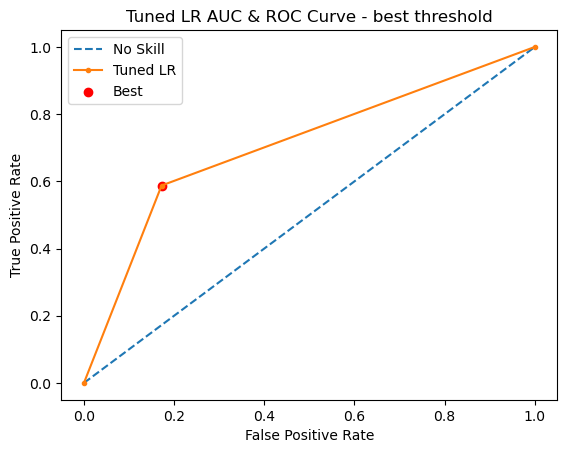

In [97]:
#Tuned LR model: ROC, AUC and best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_lr_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_lr_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('LR AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned LR AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned LR')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.614


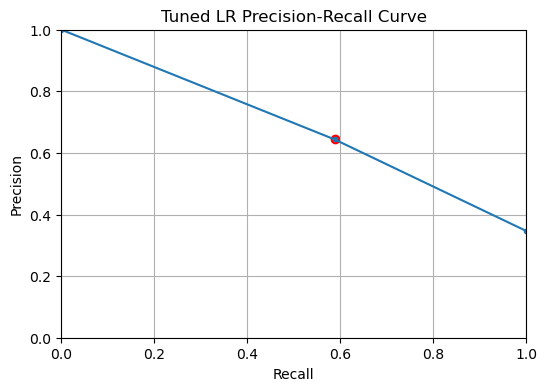

In [98]:
#Best threshold for tuned LR according to the Precision-Recall curve

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_lr_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned LR Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

According to ROC-AUC (LR AUC = 0.708) and Precision-Recall Curve, the best threshold is 1 (with G-Mean=0.697 and F-Score=0.614) for the tuned LR model.

In [99]:
#5e) Adaptive Boosting Model 

from sklearn.ensemble import AdaBoostClassifier

abc = AdaBoostClassifier()

In [ ]:
n_estimators = np.arange(1,100,1)
lr_rate = np.arange(1,25,1)

param_grid = {'n_estimators':n_estimators , 'learning_rate':lr_rate}

grid_search = GridSearchCV(abc , param_grid , verbose = 2 , error_score = 'raise')
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 2376 candidates, totalling 11880 fits
[CV] END ....................learning_rate=1, n_estimators=1; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=1; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=1; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=1; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=1; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=2; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=2; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=2; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=2; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=2; total time=   0.0s
[CV] END ....................learning_rate=1, n_estimators=3; total time=   0.0s
[CV] END ....................learning_rate=

In [127]:
grid_search.best_estimator_

KNeighborsClassifier(leaf_size=1, metric='manhattan')

In [128]:
abc_tuned = grid_search.best_estimator_
abc_tuned.fit(X_train, y_train)
y_pred_abc_tuned = abc_tuned.predict(X_test)

/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [129]:
# Summarize results
print(classification_report(y_test, y_pred_abc_tuned))
print(confusion_matrix(y_test, y_pred_abc_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.80      0.78      0.79       151
           1       0.60      0.62      0.61        80

    accuracy                           0.73       231
   macro avg       0.70      0.70      0.70       231
weighted avg       0.73      0.73      0.73       231

[[118  33]
 [ 30  50]]
{'leaf_size': 1, 'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}
0.7777544840437921


In [130]:
#Tuned ABC accuracy on training data

y_abc_pred_train_tuned = abc_tuned.predict(X_train)

print(accuracy_score(y_train, y_abc_pred_train_tuned))
confusion_matrix(y_train, y_abc_pred_train_tuned)

0.8491620111731844


/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([[319,  30],
       [ 51, 137]])

In [131]:
#Tuned ABC accuracy on testing data

print(accuracy_score(y_test, y_pred_abc_tuned))
confusion_matrix(y_test, y_pred_abc_tuned)

0.7272727272727273


array([[118,  33],
       [ 30,  50]])

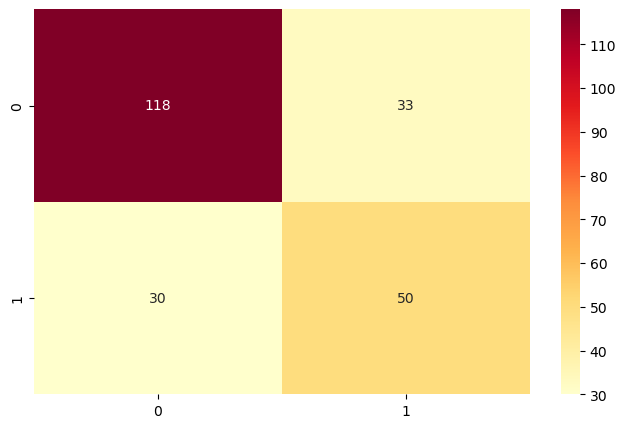

In [132]:
cm_abc_tuned = confusion_matrix(y_test, y_pred_abc_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_abc_tuned, annot=True, fmt='g', cmap='YlOrRd')
plt.show()

The tuned SBC model doesn't seem to be overfitting. It is 78% accurate on TN and 62% accurate on TP. Compared to the other models, it is not very accurate overall.

ABC AUC=0.703, Best Threshold=1.000000, G-Mean=0.699


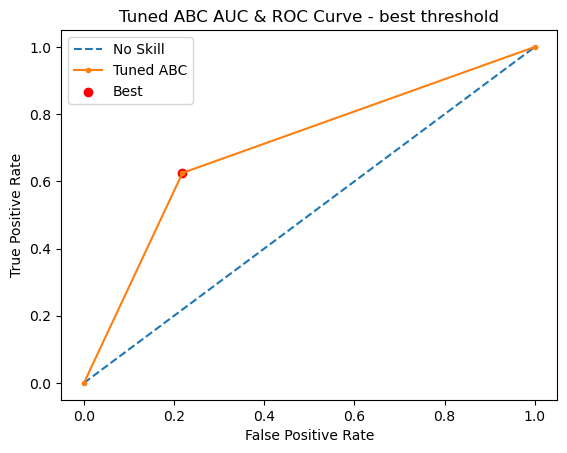

In [133]:
#Tuned ABC model: ROC, AUC and best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_abc_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_abc_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('ABC AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned ABC AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned ABC')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.613


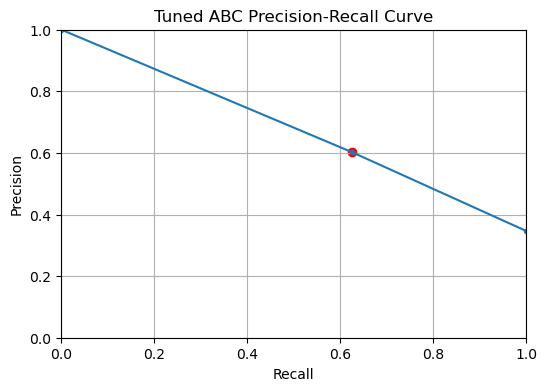

In [134]:
#Best threshold for tuned ABC model according to the Precision-Recall curve

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_abc_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned ABC Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

According to ROC-AUC (ABC AUC=0.703) and Precision-Recall Curve, the best threshold is 1 (with G-Mean=0.699 and F-Score=0.613) for the tuned ABC model.

In [135]:
#5f) K-Nearest Neighbor Model

from sklearn.neighbors import KNeighborsClassifier

knn= KNeighborsClassifier()

In [136]:
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [137]:
y_pred_knn

array([1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0])

In [138]:
#KNN accuracy on training data

y_pred_knn_train = knn.predict(X_train)

print(accuracy_score(y_train, y_pred_knn_train))
confusion_matrix(y_train, y_pred_knn_train)

0.8379888268156425


/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([[316,  33],
       [ 54, 134]])

In [139]:
#KNN accuracy on testing data

print(accuracy_score(y_test, y_pred_knn))
confusion_matrix(y_test, y_pred_knn)

0.7186147186147186


array([[116,  35],
       [ 30,  50]])

In [140]:
print(classification_report(y_pred_knn, y_test))

              precision    recall  f1-score   support

           0       0.77      0.79      0.78       146
           1       0.62      0.59      0.61        85

    accuracy                           0.72       231
   macro avg       0.70      0.69      0.69       231
weighted avg       0.72      0.72      0.72       231



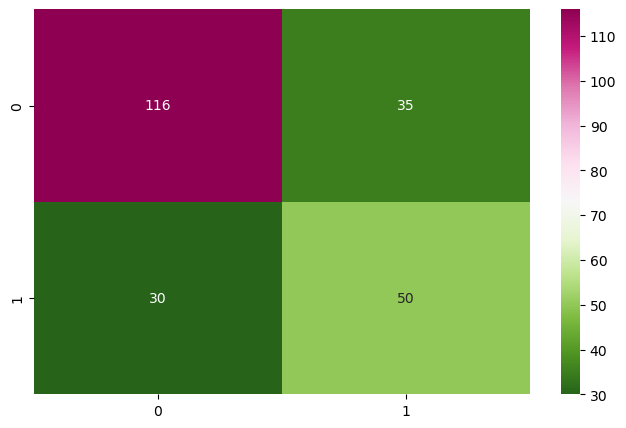

In [141]:
cm_knn = confusion_matrix(y_test, y_pred_knn)

plt.figure(figsize=(8,5))
sns.heatmap(cm_knn, annot=True, fmt='g', cmap='PiYG_r')
plt.show()

In [142]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [143]:
#Hyperparameter tuning for the KNN model

knn_params = {
    "n_neighbors": range(1, 30, 2),
    "weights": ["uniform", "distance"],
    "metric": ["euclidean", "manhattan", "minkowski"],
    #"algorithm" : ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": range(1, 50, 5),
}


In [144]:
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=knn, param_grid=knn_params, n_jobs=1, cv=cv, scoring="accuracy", error_score=0)
grid_search.fit(X_train, y_train)

/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None wi

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=42),
             error_score=0, estimator=KNeighborsClassifier(), n_jobs=1,
             param_grid={'leaf_size': range(1, 50, 5),
                         'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': range(1, 30, 2),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [145]:
grid_search.best_estimator_

KNeighborsClassifier(leaf_size=1, metric='manhattan')

In [146]:
knn_tuned = grid_search.best_estimator_
knn_tuned.fit(X_train, y_train)
y_pred_knn_tuned = knn_tuned.predict(X_test)

/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [147]:
# Summarize results
print(classification_report(y_test, y_pred_knn_tuned))
print(confusion_matrix(y_test, y_pred_knn_tuned))
print(grid_search.best_params_)
print(grid_search.best_score_)

              precision    recall  f1-score   support

           0       0.80      0.78      0.79       151
           1       0.60      0.62      0.61        80

    accuracy                           0.73       231
   macro avg       0.70      0.70      0.70       231
weighted avg       0.73      0.73      0.73       231

[[118  33]
 [ 30  50]]
{'leaf_size': 1, 'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}
0.7777544840437921


In [148]:
#Tuned KNN accuracy on training data

y_knn_pred_train_tuned = knn_tuned.predict(X_train)

print(accuracy_score(y_train, y_knn_pred_train_tuned))
confusion_matrix(y_train, y_knn_pred_train_tuned)

0.8491620111731844


/Users/niccolocomar/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([[319,  30],
       [ 51, 137]])

In [149]:
#Tuned KNN accuracy on testing data

print(accuracy_score(y_test, y_pred_abc_tuned))
confusion_matrix(y_test, y_pred_abc_tuned)

0.7272727272727273


array([[118,  33],
       [ 30,  50]])

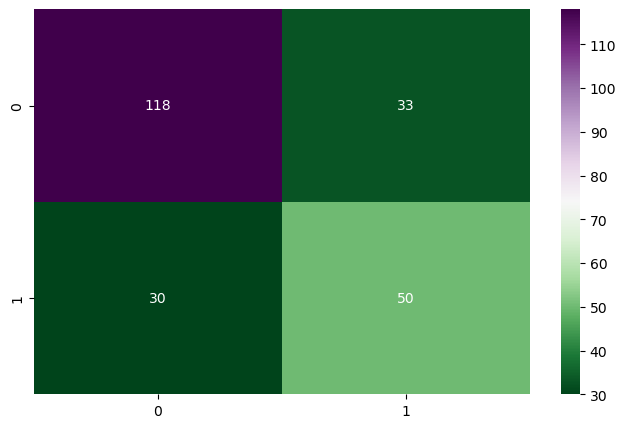

In [153]:
cm_knn_tuned = confusion_matrix(y_test, y_pred_knn_tuned)
plt.figure(figsize=(8,5))
sns.heatmap(cm_knn_tuned, annot=True, fmt='g', cmap='PRGn_r')
plt.show()

The tuned KNN model has a similar performance to the tuned ABC model. Compared to the simple KNN instantiated earlier, it only improved a little on predicting TN.

ABC AUC=0.703, Best Threshold=1.000000, G-Mean=0.699


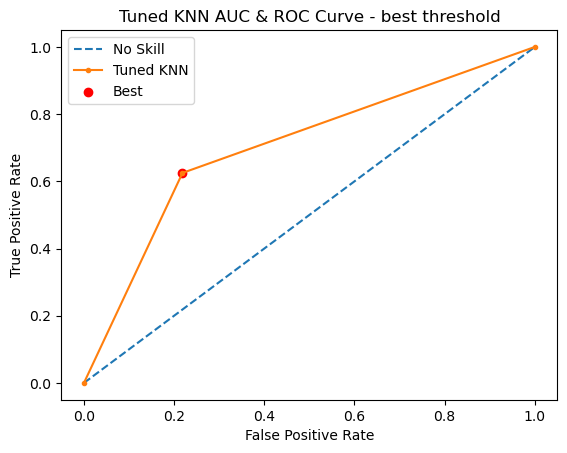

In [151]:
#Tuned KNN model: ROC, AUC and best threshold

from sklearn import metrics
auc = metrics.roc_auc_score(y_test, y_pred_knn_tuned)

false_positive_rate, true_positive_rate, thresholds = metrics.roc_curve(y_test, y_pred_knn_tuned)

from numpy import sqrt
from numpy import argmax

# calculate the g-mean for each threshold
gmeans = sqrt(true_positive_rate * (1-false_positive_rate))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('ABC AUC=%.3f, Best Threshold=%f, G-Mean=%.3f' % (auc, thresholds[ix], gmeans[ix]))

# plot the roc and auc curves for the model
plt.title("Tuned KNN AUC & ROC Curve - best threshold")
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(false_positive_rate, true_positive_rate, marker='.', label='Tuned KNN')
plt.scatter(false_positive_rate[ix], true_positive_rate[ix], marker='o', color='red', label='Best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Best Threshold=1.000000, F-Score=0.613


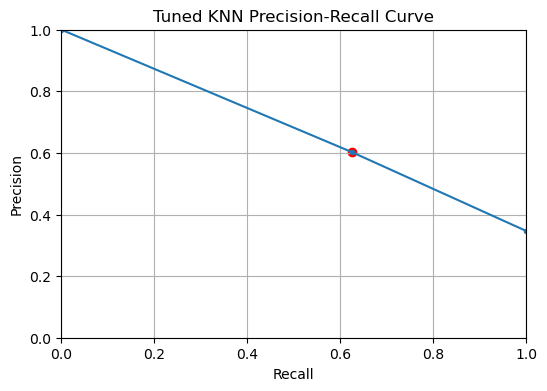

In [152]:
#Best threshold for tuned KNN model according to the Precision-Recall curve

from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_knn_tuned)

fscore = (2 * precision * recall) / (precision + recall)
ix = argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

plt.figure(figsize=(6, 4), dpi=100)
plt.plot(recall, precision, marker='.')
plt.title("Tuned KNN Precision-Recall Curve")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.scatter(recall[ix], precision[ix], marker='o', color='red', label='Best')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid(True)
plt.show()

The best threshold for the tuned KNN is 1, with AUC=0.703, G-Mean=0.699, F-Score=0.613.